### Import Necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')
from statsmodels.tsa.stattools import adfuller, kpss
from statsmodels.tsa.seasonal import seasonal_decompose
from pandas.plotting import autocorrelation_plot
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from pmdarima import auto_arima
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX,SARIMAXResults
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.metrics import r2_score, mean_absolute_error, mean_absolute_percentage_error
from sklearn.preprocessing import StandardScaler

### Import the Data

In [2]:
df = pd.read_csv('Walmart DataSet.csv')
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


### Analyse and transform the dataset

In [3]:
df.shape

(6435, 8)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [5]:
datatype = pd.DataFrame()
datatype['Feature'] = df.columns
dtype = []
for col in df.columns:
    dty = df[col].dtype
    dtype.append(dty)
datatype['Dtype'] = dtype
datatype

,Feature,Dtype
0,Store,int64
1,Date,object
2,Weekly_Sales,float64
3,Holiday_Flag,int64
4,Temperature,float64
5,Fuel_Price,float64
6,CPI,float64
7,Unemployment,float64


In [6]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Holiday_Flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
CPI,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
Unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01


In [7]:
df['Date'] = pd.to_datetime(df['Date'], dayfirst=True)

In [8]:
df1 = df.copy()
df1['year'] = df1['Date'].dt.year
df1['month'] = df1['Date'].dt.month
df1['week'] = df1['Date'].dt.isocalendar().week.astype(int)
df1.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,week
0,1,2010-02-05,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,5
1,1,2010-02-12,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,6
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,7
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,8
4,1,2010-03-05,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,9


In [9]:
df1.index = df1['Date']
df1.drop(['Date'], axis=1, inplace=True)
df1.head()

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,week
Date,,,,,,,,,,
2010-02-05,1,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,5
2010-02-12,1,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,6
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,7
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,8
2010-03-05,1,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,9


#### Checking missing values

In [10]:
df1.isnull().sum()

Store           0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
year            0
month           0
week            0
dtype: int64

In [11]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [12]:
null_percentage = pd.DataFrame()
null_percentage['Feature'] = df.columns
null_value = []
for col in df.columns:
    value = df[col].isnull().sum()
    percentage = (value/len(df))*100
    null_value.append(percentage)
    
null_percentage['% Null'] = null_value
null_percentage

,Feature,% Null
0,Store,0.0
1,Date,0.0
2,Weekly_Sales,0.0
3,Holiday_Flag,0.0
4,Temperature,0.0
5,Fuel_Price,0.0
6,CPI,0.0
7,Unemployment,0.0


There are no missing values in the given dataset

In [13]:
df.corr()

C:\Users\Nandhakumar\AppData\Local\Temp\ipykernel_8536\1134722465.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
Store,1.000000e+00,-0.335332,-4.386841e-16,-0.022659,0.060023,-0.209492,0.223531
Weekly_Sales,-3.353320e-01,1.000000,3.689097e-02,-0.063810,0.009464,-0.072634,-0.106176
Holiday_Flag,-4.386841e-16,0.036891,1.000000e+00,-0.155091,-0.078347,-0.002162,0.010960
Temperature,-2.265908e-02,-0.063810,-1.550913e-01,1.000000,0.144982,0.176888,0.101158
Fuel_Price,6.002295e-02,0.009464,-7.834652e-02,0.144982,1.000000,-0.170642,-0.034684
CPI,-2.094919e-01,-0.072634,-2.162091e-03,0.176888,-0.170642,1.000000,-0.302020
Unemployment,2.235313e-01,-0.106176,1.096028e-02,0.101158,-0.034684,-0.302020,1.000000


C:\Users\Nandhakumar\AppData\Local\Temp\ipykernel_8536\1927239732.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap='coolwarm',fmt='.2f')


<Axes: >

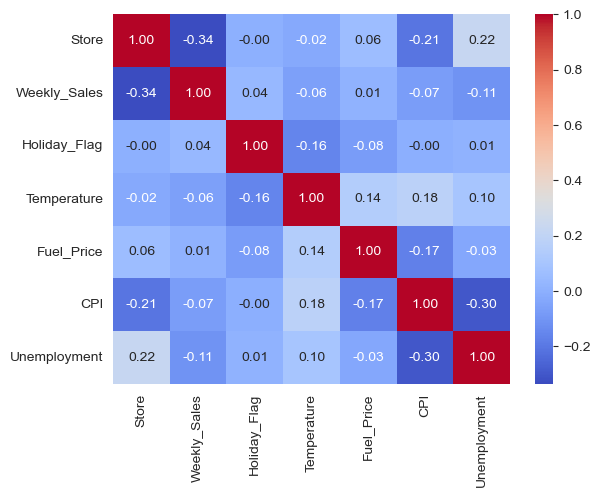

In [14]:
sns.heatmap(df.corr(), annot=True, cmap='coolwarm',fmt='.2f')

### Exploratory Data Analysis

#### Checking the distribution of data

In [15]:
col_list1 = df1.columns
col_list1

Index(['Store', 'Weekly_Sales', 'Holiday_Flag', 'Temperature', 'Fuel_Price',
       'CPI', 'Unemployment', 'year', 'month', 'week'],
      dtype='object')

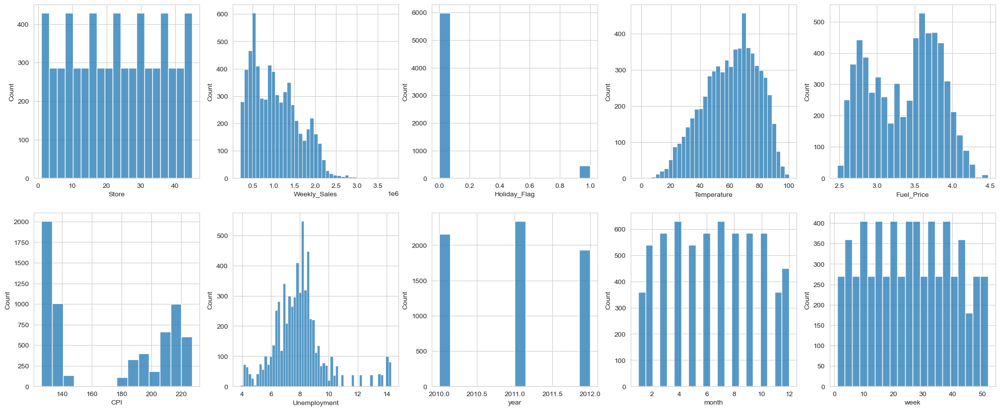

In [16]:
plt.subplots(2,5, figsize=(25,10))
i = 1
for col in col_list1:
    plt.subplot(2,5,i)
    sns.histplot(df1[col])
    i += 1

From the above visualization we can see that the columns 'Weekly_Sales','Unemployment' and 'Temperature' are having skewed data, this shows that they may have some outliers.

#### Checking for outliers

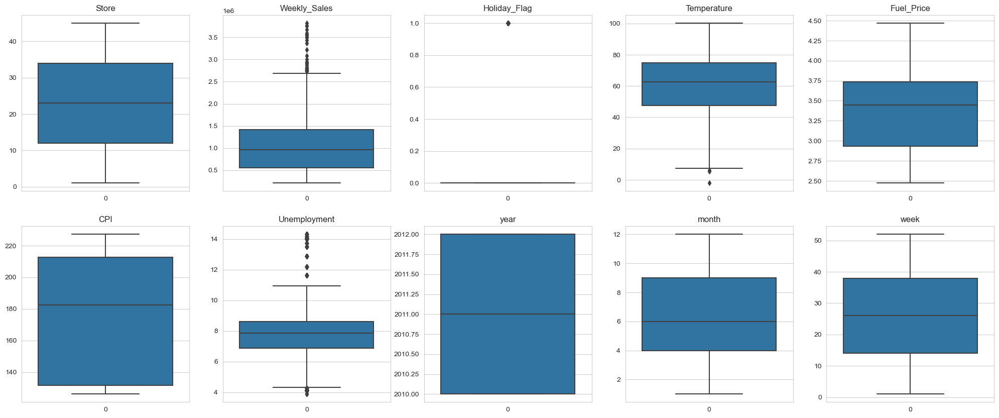

In [17]:
plt.subplots(2,5, figsize=(25,10))
i = 1
for col in col_list1:
    plt.subplot(2,5,i)
    sns.boxplot(df1[col])
    plt.title(col)
    i += 1

From the above visualization we can confirm that the columns 'Weekly_Sales','Unemployment' and 'Temperature' are having the outliers.

### Split the dataset based on the Store id.

In [18]:
Stores = {}
for i in range(1,46):
    Stores[i] = df1[df1['Store'] == i]

In [19]:
Stores

{1:             Store  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price  \
 Date                                                                     
 2010-02-05      1    1643690.90             0        42.31       2.572   
 2010-02-12      1    1641957.44             1        38.51       2.548   
 2010-02-19      1    1611968.17             0        39.93       2.514   
 2010-02-26      1    1409727.59             0        46.63       2.561   
 2010-03-05      1    1554806.68             0        46.50       2.625   
 ...           ...           ...           ...          ...         ...   
 2012-09-28      1    1437059.26             0        76.08       3.666   
 2012-10-05      1    1670785.97             0        68.55       3.617   
 2012-10-12      1    1573072.81             0        62.99       3.601   
 2012-10-19      1    1508068.77             0        67.97       3.594   
 2012-10-26      1    1493659.74             0        69.16       3.506   
 
                    

In [20]:
for i in Stores.keys():
    print(f'Store {i}: {Stores[i].shape}')

Store 1: (143, 10)
Store 2: (143, 10)
Store 3: (143, 10)
Store 4: (143, 10)
Store 5: (143, 10)
Store 6: (143, 10)
Store 7: (143, 10)
Store 8: (143, 10)
Store 9: (143, 10)
Store 10: (143, 10)
Store 11: (143, 10)
Store 12: (143, 10)
Store 13: (143, 10)
Store 14: (143, 10)
Store 15: (143, 10)
Store 16: (143, 10)
Store 17: (143, 10)
Store 18: (143, 10)
Store 19: (143, 10)
Store 20: (143, 10)
Store 21: (143, 10)
Store 22: (143, 10)
Store 23: (143, 10)
Store 24: (143, 10)
Store 25: (143, 10)
Store 26: (143, 10)
Store 27: (143, 10)
Store 28: (143, 10)
Store 29: (143, 10)
Store 30: (143, 10)
Store 31: (143, 10)
Store 32: (143, 10)
Store 33: (143, 10)
Store 34: (143, 10)
Store 35: (143, 10)
Store 36: (143, 10)
Store 37: (143, 10)
Store 38: (143, 10)
Store 39: (143, 10)
Store 40: (143, 10)
Store 41: (143, 10)
Store 42: (143, 10)
Store 43: (143, 10)
Store 44: (143, 10)
Store 45: (143, 10)


The dataset is splitted into 45  parts based on the store number, and each datset have 143 rows and 7 columns

#### a. If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?


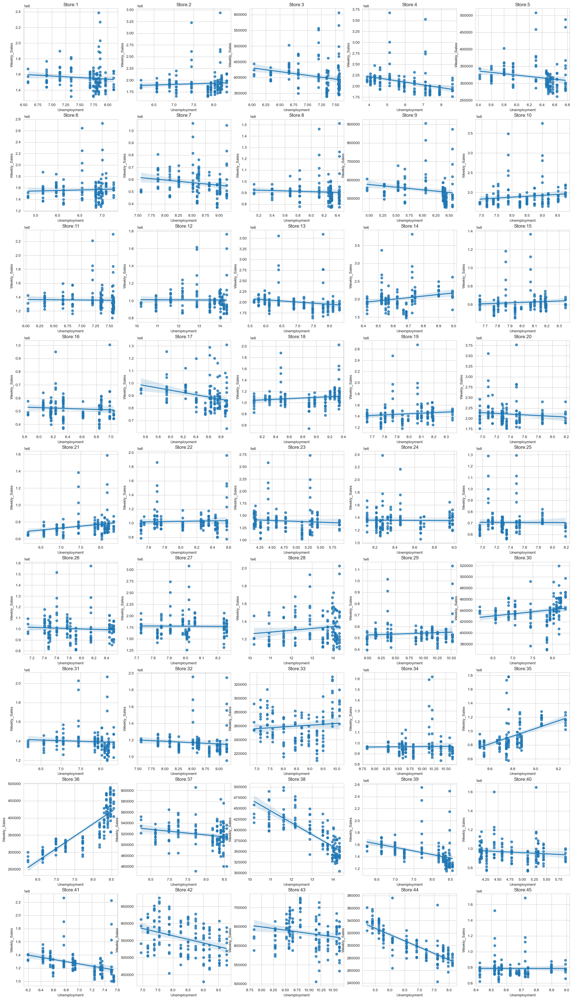

In [21]:
# Check this with visualization
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.regplot(x='Unemployment', y='Weekly_Sales', data=Stores[i])
    plt.title(f'Store:{i}')

In [22]:
#lets check with Correlation Analysis
df_sales = df.groupby(["Store","Date"])["Weekly_Sales"].mean().reset_index()
df_merged = pd.merge(df_sales, df[["Store","Date","Unemployment"]], on=["Store","Date"])
df_corr = df_merged.groupby("Store")[["Weekly_Sales","Unemployment"]].corr().iloc[0::2,-1].reset_index()
df_corr.drop(['level_1'], axis=1, inplace=True)
print(df_corr)

    Store  Unemployment
0       1     -0.097955
1       2      0.066325
2       3     -0.230413
3       4     -0.337015
4       5     -0.207043
5       6      0.044251
6       7     -0.165382
7       8     -0.052580
8       9     -0.191534
9      10      0.131908
10     11     -0.020339
11     12     -0.009286
12     13     -0.171633
13     14      0.210786
14     15      0.078905
15     16     -0.070864
16     17     -0.263600
17     18      0.139179
18     19      0.101464
19     20     -0.095341
20     21      0.218367
21     22      0.039043
22     23     -0.077169
23     24     -0.012261
24     25     -0.004958
25     26     -0.066899
26     27     -0.014275
27     28      0.136671
28     29      0.084682
29     30      0.201862
30     31     -0.064738
31     32     -0.099455
32     33      0.101175
33     34      0.017010
34     35      0.483865
35     36      0.833734
36     37     -0.221287
37     38     -0.785290
38     39     -0.384681
39     40     -0.112528
40     41     -0

In [23]:
pos_corr = []
neg_corr = []
no_corr = []
for i in df_corr['Unemployment']:
    if i > 0:
        pos_corr.append(i)
    elif i < 0:
        neg_corr.append(i)
    else:
        no_corr.append(i)
        
len(pos_corr), len(neg_corr), len(no_corr)

(16, 29, 0)

In [19]:
max_corr = df_corr['Unemployment'].max()
min_corr = df_corr['Unemployment'].min()
print('Maximum positively correlated value is', max_corr)
print('Maximum negatively correlated value is', min_corr)

Maximum positively correlated value is 0.8337336178415088
Maximum negatively correlated value is -0.7852902748572036


In [20]:
df_pos_corr = []
df_neg_corr = []
df_no_corr = []
for i in df_corr['Unemployment']:
    if i > 0:
        df_pos_corr.append(i)
    elif i < 0:
        df_neg_corr.append(i)
    else:
        df_no_corr.append(i)
        
len(df_pos_corr), len(df_neg_corr), len(df_no_corr)

(16, 29, 0)

In [21]:
strong_pos_corr = []
strong_neg_corr = []
for i in df_corr['Unemployment']:
    if i > 0.7:
        strong_pos_corr.append(i)
    elif i < -0.7:
        strong_neg_corr.append(i)
        
print('Strongly correlated stores are ', len(strong_pos_corr)+len(strong_neg_corr))

Strongly correlated stores are  3


In [22]:
df_pos_max_corr = max(df_pos_corr)
df_pos_min_corr = min(df_pos_corr)
df_neg_max_corr = max(df_neg_corr)
df_neg_min_corr = min(df_neg_corr)
print('Maximum positively correlated value is', df_pos_max_corr)
print('Minimum positively correlated value is', df_pos_min_corr)
print('Maximum negatively correlated value is', df_neg_max_corr)
print('Minimum negatively correlated value is', df_neg_min_corr)

Maximum positively correlated value is 0.8337336178415088
Minimum positively correlated value is 0.017010250652790146
Maximum negatively correlated value is -0.004041028359857014
Minimum negatively correlated value is -0.7852902748572036


In [23]:
df_corr[df_corr['Unemployment'] == max_corr]

,Store,Unemployment
35,36,0.833734


In [24]:
df_corr[df_corr['Unemployment'] == min_corr]

,Store,Unemployment
37,38,-0.78529


The correlation values are matched with the visualization of the relationship of Unemployment on weekly_Sales. 

The Stores are affected by the Unemployment rate, 16 stores are positively correlated and 29 stores are negatively correlated with the unemployment rate.

Only 3 stores are strongly correlated with Unemployent rate. 

And the highly affected Stores are

    1. Store 36 is Highly affected by the Unemplyment in positive direction
    
    2. Store 38 is Highly affected by the Unemployment in negative direction

#### b. If the weekly sales show a seasonal trend, when and what could be the reason?

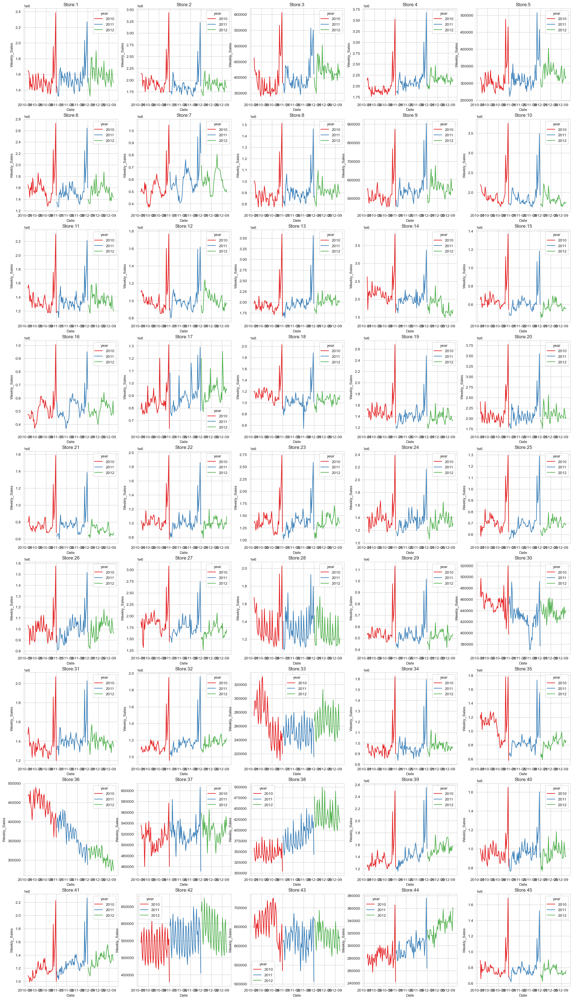

In [25]:
# Lets visualize the sales of all 45 Stores
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.lineplot(x='Date', y='Weekly_Sales', data=Stores[i], hue='year',palette='Set1')
    plt.title(f'Store:{i}')

From the above graph we can see that the weekly sales of each store shows a seasionality at the end of the year

In [26]:
df1[df1['Holiday_Flag']==1]['week'].unique()

array([ 6, 36, 47, 52])

In [27]:
df1[df1['Holiday_Flag']==1]['month'].unique()

array([ 2,  9, 11, 12], dtype=int64)

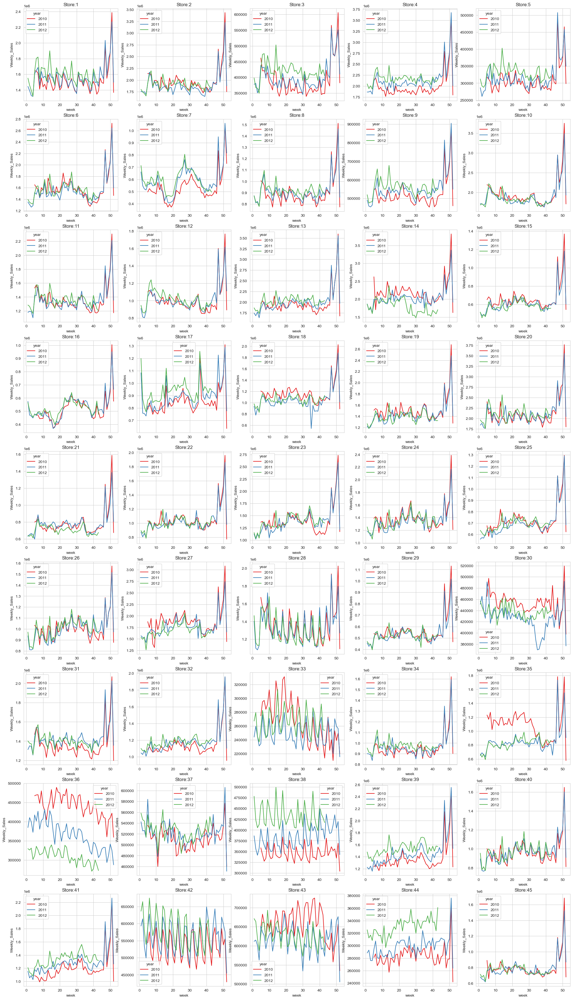

In [28]:
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.lineplot(x='week', y='Weekly_Sales', data=Stores[i], hue='year', palette='Set1')
    plt.title(f'Store:{i}')

<Axes: xlabel='week', ylabel='Weekly_Sales'>

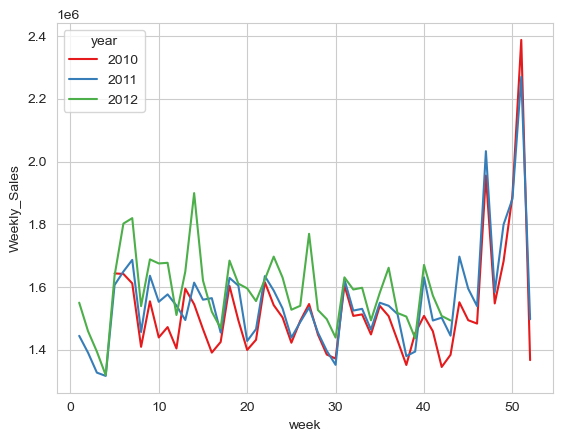

In [29]:
sns.lineplot(x='week', y='Weekly_Sales', data=Stores[1], hue='year', palette='Set1')

1. From the above graphs we can wee that the seasionality of each store occurs in the end of the year.

2. The Festival weeks (Holiday_Flag) are 6, 36, 47, 52 which means the holidays are come at the end of the year.

3. So the reason for seasionality in the weekly sales of each stores are Holidays (Festivals). 

4. The Sales are increased in the Holidays so the seasionality occurs.

#### c. Does temperature affect the weekly sales in any manner?

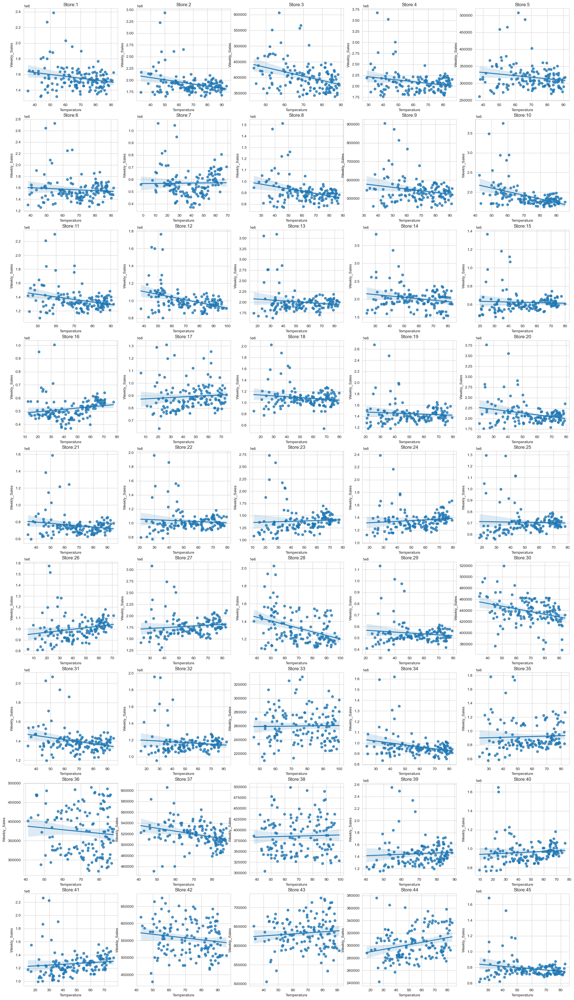

In [30]:
# Check the relationship by visualization
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.regplot(x='Temperature', y='Weekly_Sales', data=Stores[i])
    plt.title(f'Store:{i}')

1. From the graph we can see that the weekly sales weakly correlated to temperature.
2. We can confirm this by correlation analysis.

In [31]:
# Checking the correlation between Temperature and Weekly sales
df_temp = df.groupby(["Store","Date"])["Weekly_Sales"].mean().reset_index()
tp_merged = pd.merge(df_temp, df[["Store","Date","Temperature"]], on=["Store","Date"])
tp_corr = tp_merged.groupby("Store")[["Weekly_Sales","Temperature"]].corr().iloc[0::2,-1].reset_index()
tp_corr.drop(['level_1'], axis=1, inplace=True)
print(tp_corr)

    Store  Temperature
0       1    -0.222701
1       2    -0.297673
2       3    -0.377524
3       4    -0.225583
4       5    -0.175517
5       6    -0.084863
6       7     0.015077
7       8    -0.312324
8       9    -0.208343
9      10    -0.432569
10     11    -0.278503
11     12    -0.379416
12     13    -0.137746
13     14    -0.199851
14     15    -0.050541
15     16     0.182948
16     17     0.081012
17     18    -0.144278
18     19    -0.080805
19     20    -0.264983
20     21    -0.177084
21     22    -0.082892
22     23     0.056257
23     24     0.111833
24     25    -0.031311
25     26     0.211722
26     27     0.121809
27     28    -0.376506
28     29    -0.129144
29     30    -0.330816
30     31    -0.262192
31     32    -0.111681
32     33     0.019244
33     34    -0.278523
34     35     0.043392
35     36    -0.094454
36     37    -0.300493
37     38     0.032993
38     39     0.064738
39     40     0.090598
40     41     0.106761
41     42    -0.151639
42     43  

In [32]:
tp_pos_corr = []
tp_neg_corr = []
tp_no_corr = []
for i in tp_corr['Temperature']:
    if i > 0:
        tp_pos_corr.append(i)
    elif i < 0:
        tp_neg_corr.append(i)
    else:
        tp_no_corr.append(i)
        
len(tp_pos_corr), len(tp_neg_corr), len(tp_no_corr)

(15, 30, 0)

In [33]:
strong_pos_corr = []
strong_neg_corr = []
for i in tp_corr['Temperature']:
    if i > 0.7:
        strong_pos_corr.append(i)
    elif i < -0.7:
        strong_neg_corr.append(i)
        
print('Strongly correlated stores are ', len(strong_pos_corr)+len(strong_neg_corr))

Strongly correlated stores are  0


In [34]:
tp_pos_max_corr = max(tp_pos_corr)
tp_pos_min_corr = min(tp_pos_corr)
tp_neg_max_corr = max(tp_neg_corr)
tp_neg_min_corr = min(tp_neg_corr)
print('Maximum positively correlated value is', tp_pos_max_corr)
print('Minimum positively correlated value is', tp_pos_min_corr)
print('Maximum negatively correlated value is', tp_neg_max_corr)
print('Minimum negatively correlated value is', tp_neg_min_corr)

Maximum positively correlated value is 0.267822192302318
Minimum positively correlated value is 0.015077462599194569
Maximum negatively correlated value is -0.031311150346977255
Minimum negatively correlated value is -0.4325686888435955


1. According to the correlation analysis 15 stores are positively correlated and 30 stores are negatively correlated out of 45 stores.

2. And Yes the Temperature affects the weekly sales and the correlation is too weak.

3. The Maximum positively correlated value is 0.267822192302318 and the maximum negatively correlated value is -0.4325686888435955. 

#### d. How is the Consumer Price index affecting the weekly sales of various stores?

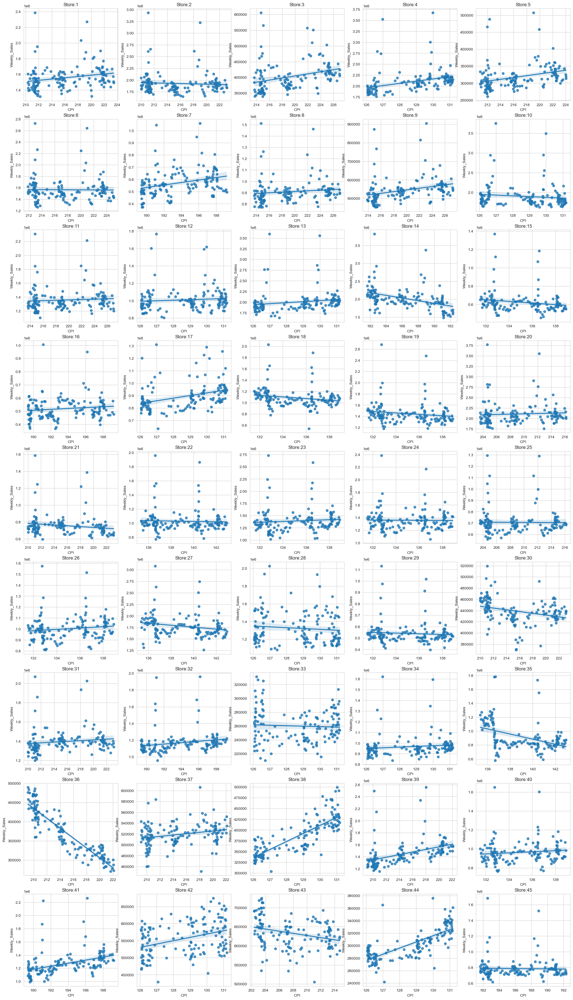

In [35]:
# Check the relationship using visualization
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    plt.subplot(9,5,i)
    sns.regplot(x='CPI', y='Weekly_Sales', data=Stores[i])
    plt.title(f'Store:{i}')

From the above graph we can see that the CPI is affected the weekly sales of various stores in different ways.

In [36]:
# Correlation Analysis of weekly sales and CPI
df_cpi = df.groupby(["Store","Date"])["Weekly_Sales"].mean().reset_index()
cpi_merged = pd.merge(df_cpi, df[["Store","Date","CPI"]], on=["Store","Date"])
cpi_corr = cpi_merged.groupby("Store")[["Weekly_Sales","CPI"]].corr().iloc[0::2,-1].reset_index()
cpi_corr.drop(['level_1'], axis=1, inplace=True)
print(cpi_corr)

    Store       CPI
0       1  0.225408
1       2 -0.062431
2       3  0.317250
3       4  0.351157
4       5  0.308261
5       6 -0.011357
6       7  0.289044
7       8  0.120255
8       9  0.294805
9      10 -0.115374
10     11  0.069781
11     12  0.084087
12     13  0.163976
13     14 -0.419755
14     15 -0.174467
15     16  0.124285
16     17  0.348571
17     18 -0.193541
18     19 -0.155341
19     20  0.058706
20     21 -0.163649
21     22 -0.038602
22     23  0.084248
23     24 -0.013684
24     25 -0.010914
25     26  0.131980
26     27 -0.213082
27     28 -0.095908
28     29 -0.072530
29     30 -0.298188
30     31  0.132887
31     32  0.196782
32     33 -0.052271
33     34  0.115437
34     35 -0.424107
35     36 -0.915095
36     37  0.244507
37     38  0.812837
38     39  0.428043
39     40  0.113318
40     41  0.392293
41     42  0.360859
42     43 -0.285686
43     44  0.740150
44     45 -0.023548


In [37]:
cpi_pos_corr = []
cpi_neg_corr = []
cpi_no_corr = []
for i in cpi_corr['CPI']:
    if i > 0:
        cpi_pos_corr.append(i)
    elif i < 0:
        cpi_neg_corr.append(i)
    else:
        cpi_no_corr.append(i)
        
len(cpi_pos_corr), len(cpi_neg_corr), len(cpi_no_corr)

(25, 20, 0)

In [38]:
strong_pos_corr = []
strong_neg_corr = []
for i in cpi_corr['CPI']:
    if i > 0.7:
        strong_pos_corr.append(i)
    elif i < -0.7:
        strong_neg_corr.append(i)
        
print('Strongly correlated stores are ', len(strong_pos_corr)+len(strong_neg_corr))

Strongly correlated stores are  3


In [39]:
cpi_max_corr = max(cpi_pos_corr)
cpi_min_corr = max(cpi_neg_corr)
cpi_pos_corr_min = min(cpi_pos_corr)
cpi_neg_corr_min = min(cpi_neg_corr)
print('Maximum positively correlated value is', cpi_max_corr)
print('Minimum positively correlated value is', cpi_pos_corr_min)
print('Maximum positively correlated value is', cpi_min_corr)
print('Minimum negatively correlated value is', cpi_neg_corr_min)

Maximum positively correlated value is 0.8128368242188552
Minimum positively correlated value is 0.05870588224585207
Maximum positively correlated value is -0.010914330648432623
Minimum negatively correlated value is -0.9150952776725542


1. From the correlation analysis we can see that 25 stores are positively correlated nd 20 stores are negatively correlated.
2. Only 3 stores are strongly correlated with CPI and all other stores are weakly correlated
3. This concludes CPI does not have a significant impact on the weekly sales of Walmart stores.
4. Maximum positively correlated value is 0.8128368242188552 and maximum negativelt correlated value is -0.9150952776725542.

#### e. Top performing stores according to the historical data

In [40]:
# According to total sales
total_sales_list = []
total_sales = {}
for i in range(1,46):
    store=Stores[i]
    sum_sales = sum(store['Weekly_Sales'])
    total_sales_list.append(sum_sales)
    total_sales[i] = sum_sales
    
total_sales

{1: 222402808.85000005,
 2: 275382440.9800001,
 3: 57586735.07,
 4: 299543953.38,
 5: 45475688.9,
 6: 223756130.64000002,
 7: 81598275.14,
 8: 129951181.13,
 9: 77789218.99,
 10: 271617713.8899999,
 11: 193962786.79999992,
 12: 144287230.14999998,
 13: 286517703.80000013,
 14: 288999911.34000003,
 15: 89133683.91999997,
 16: 74252425.40000002,
 17: 127782138.83000007,
 18: 155114734.21,
 19: 206634862.1,
 20: 301397792.46000004,
 21: 108117878.92,
 22: 147075648.57000002,
 23: 198750617.8499999,
 24: 194016021.27999994,
 25: 101061179.16999999,
 26: 143416393.79000008,
 27: 253855916.88000003,
 28: 189263680.57999986,
 29: 77141554.30999997,
 30: 62716885.12000001,
 31: 199613905.49999997,
 32: 166819246.16000003,
 33: 37160221.960000016,
 34: 138249763.00000003,
 35: 131520672.07999992,
 36: 53412214.969999984,
 37: 74202740.32000001,
 38: 55159626.420000024,
 39: 207445542.46999997,
 40: 137870309.79000008,
 41: 181341934.88999993,
 42: 79565752.42999996,
 43: 90565435.41000003,
 44:

In [41]:
max(total_sales.values())

301397792.46000004

In [42]:
best_store = print(list(total_sales.keys())[list(total_sales.values()).index(max(total_sales.values()))])
best_store

20


<Axes: xlabel='store', ylabel='Sales'>

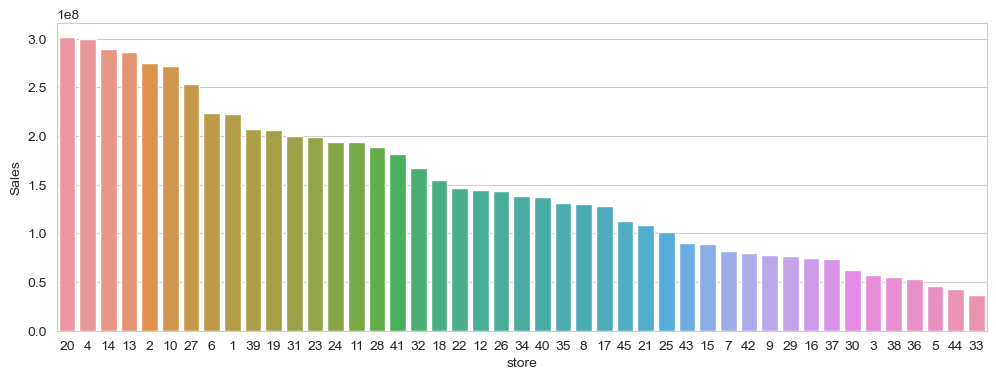

In [43]:
tot_sales = pd.DataFrame()
tot_sales['store'] = total_sales.keys()
tot_sales['Sales'] = total_sales.values()
plt.figure(figsize=(12,4))
sns.barplot(x='store',y='Sales', data=tot_sales, order=tot_sales.sort_values('Sales',ascending=False).store)

In [44]:
print(tot_sales.sort_values('Sales',ascending=False).head().to_string())

    store         Sales
19     20  3.013978e+08
3       4  2.995440e+08
13     14  2.889999e+08
12     13  2.865177e+08
1       2  2.753824e+08


According to the Total sales of each stores, top 5 performing stores are 

Store 20 with total weekly sales of $301397792.46

Sore 4 with total weekly sales of $299543953.38

Store 14 with total weekly sales of $288999911.34

Store 13 with total weekly sales of $286517703.80

Store 2 with total weekly sales of $275382440.98

In [45]:
# According to Average Sales
average_sales = {}
for i in range(1,46):
    store=Stores[i]
    avg_sales = store['Weekly_Sales'].mean()
    average_sales[i] = avg_sales
    
average_sales

{1: 1555264.3975524476,
 2: 1925751.3355244752,
 3: 402704.441048951,
 4: 2094712.9606993007,
 5: 318011.81048951054,
 6: 1564728.1862937063,
 7: 570617.3086713287,
 8: 908749.5183916083,
 9: 543980.5523776225,
 10: 1899424.5726573425,
 11: 1356383.1244755245,
 12: 1009001.6094405595,
 13: 2003620.3062937064,
 14: 2020978.400979021,
 15: 623312.474965035,
 16: 519247.73006993,
 17: 893581.3904195806,
 18: 1084718.4210489513,
 19: 1444999.0356643354,
 20: 2107676.8703496507,
 21: 756069.0833566432,
 22: 1028501.0389510489,
 23: 1389864.4604895106,
 24: 1356755.3935664338,
 25: 706721.5326573426,
 26: 1002911.8446853146,
 27: 1775216.2019580419,
 28: 1323522.2418181817,
 29: 539451.4287412587,
 30: 438579.61622377625,
 31: 1395901.437062937,
 32: 1166568.1549650352,
 33: 259861.692027972,
 34: 966781.5594405595,
 35: 919724.9795804196,
 36: 373511.9927972028,
 37: 518900.2819580419,
 38: 385731.6532867133,
 39: 1450668.129160839,
 40: 964128.0404895104,
 41: 1268125.4188111888,
 42: 5564

<Axes: xlabel='store', ylabel='Sales'>

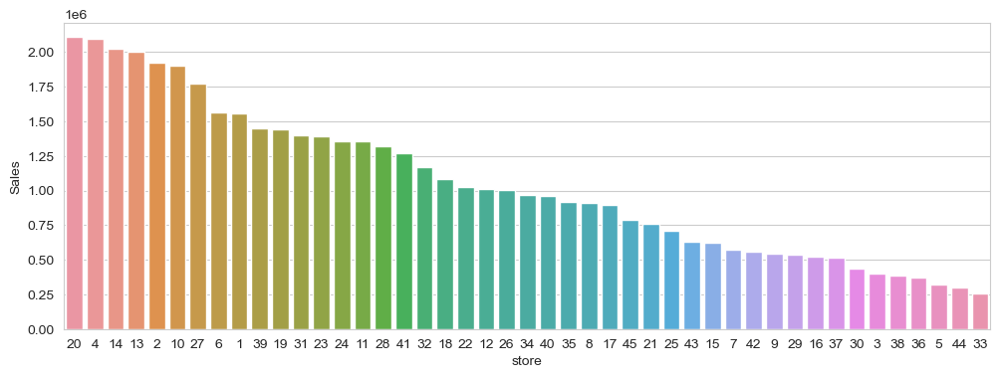

In [46]:
avg_sales = pd.DataFrame()
avg_sales['store'] = average_sales.keys()
avg_sales['Sales'] = average_sales.values()
plt.figure(figsize=(12,4))
sns.barplot(x='store',y='Sales', data=avg_sales, order=avg_sales.sort_values('Sales',ascending=False).store)

In [47]:
print(avg_sales.sort_values('Sales',ascending=False).head().to_string())

    store         Sales
19     20  2.107677e+06
3       4  2.094713e+06
13     14  2.020978e+06
12     13  2.003620e+06
1       2  1.925751e+06


According to the Average sales of each stores, top 5 performing stores are 

Store 20 with average weekly sales of $2107676.87

Sore 4 with average weekly sales of $2094712.96

Store 14 with average weekly sales of $2020978.40

Store 13 with average weekly sales of $2003620.30

Store 2 with average weekly sales of $1925751.33

#### f. The worst performing store, and how significant is the difference between the highest and lowest performing stores.

In [48]:
# According to the Total sales of each store
tot_sales[tot_sales['Sales'] == tot_sales['Sales'].min()]

,store,Sales
32,33,37160221.96


In [49]:
print(list(total_sales.keys())[list(total_sales.values()).index(min(total_sales.values()))])

33


According to the total sales the worst performing store is Store 33 with the Total weekly sales of $37160221.96

In [50]:
# According to the Average sales of each store
avg_sales[avg_sales['Sales'] == avg_sales['Sales'].min()]

,store,Sales
32,33,259861.692028


In [51]:
worst_store = print(list(average_sales.keys())[list(average_sales.values()).index(min(average_sales.values()))])
worst_store

33


According to the average sales the worst performing store is Store 33 with the Average weekly sales of $259861.69

In [52]:
diff = tot_sales['Sales'].max() - tot_sales['Sales'].min()
print(f'The difference between the highest and lowest performing store is ${diff}')

The difference between the highest and lowest performing store is $264237570.50000003


In [53]:
tot_sales['Sales'].max() / tot_sales['Sales'].min()

8.110764052605242

In [54]:
diff = avg_sales['Sales'].max() - avg_sales['Sales'].min()
print(f'The difference between the highest and lowest performing store is ${diff}')

The difference between the highest and lowest performing store is $1847815.1783216787


In [55]:
avg_sales['Sales'].max() / avg_sales['Sales'].min()

8.110764052605248

The difference between the highest and lowest performing stores is quite significant.

The difference between the total sales of highest and lowest performing store is $264237570.50

The total sales volume of best performing store is 8 times better that the total sales volume worst performing store, and it shows the same significance in average sales too

The difference between the average sales of highest and lowest performing store is $1847815.17

#### Use predictive modeling techniques to forecast the sales for each store for the next 12 weeks

### Performing various machine learning algorithms

In [56]:
def model_evaluation(x,y,model):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42)
    scaler = StandardScaler()
    x_train_scaled = scaler.fit_transform(x_train)
    x_test_scaled = scaler.transform(x_test)
    mod = model().fit(x_train_scaled,y_train)
    pred = mod.predict(x_test_scaled)
    R2_Score = r2_score(y_test, pred)
    return R2_Score

In [58]:
results = {}
models = [LinearRegression, RandomForestRegressor, DecisionTreeRegressor, AdaBoostRegressor, GradientBoostingRegressor, SVR]
for model in models:
    score_list = []
    for i in range(1,46):
        store = Stores[i]
        x = store.loc[:,['Temperature','CPI','Unemployment']]
        y = store['Weekly_Sales']
        score = model_evaluation(x,y,model)
        score_list.append(score)
    results[model.__name__] = score_list
    
df2 = pd.DataFrame(columns=results.keys())
for col in results.keys():
    df2[col] = results.get(col)

df2

,LinearRegression,RandomForestRegressor,DecisionTreeRegressor,AdaBoostRegressor,GradientBoostingRegressor,SVR
0,-0.011134,0.079692,-1.243935,0.212562,-0.200168,-0.272014
1,-0.024964,0.006834,-0.887380,-0.487489,-0.905556,-0.179449
2,0.247157,0.264333,-0.843672,0.419386,0.409115,-0.074988
3,0.240160,0.493373,0.264465,0.389193,0.367046,-0.033153
4,0.125245,0.129242,-0.474094,0.105522,0.012757,-0.167157
5,-0.125807,0.119529,-0.724381,0.132197,-0.236094,-0.274282
6,0.345017,0.423304,0.222189,0.352032,0.437818,-0.019632
7,0.093235,0.144783,-0.039600,0.407653,0.148261,-0.127263
8,0.215520,0.415105,0.119705,0.266091,0.310759,-0.087089
9,0.109502,0.258508,0.207282,0.089706,0.188641,-0.202845


In the above DataFrame columns represents the various Machine learning algorithms and rows represents the various 45 stores from the data. And the DataFrame consists of r2_score of each ML algorithm for each store.

From the DataFrame we can see that some stores are well trained and predicted upto 90% of accuracy. But most stores are not trained well have very poor accuracy of model.

In [64]:
def model_error(x,y,model):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.2, random_state=42)
    scaler = StandardScaler()
    x_train_scaled = scaler.fit_transform(x_train)
    x_test_scaled = scaler.transform(x_test)
    mod = model().fit(x_train_scaled,y_train)
    pred = mod.predict(x_test_scaled)
    Error = mean_absolute_error(y_test, pred)
    return Error

In [65]:
errors = {}
models = [LinearRegression, RandomForestRegressor, DecisionTreeRegressor, AdaBoostRegressor, GradientBoostingRegressor, SVR]
for model in models:
    score_list = []
    for i in range(1,46):
        store = Stores[i]
        x = store.loc[:,['Temperature','CPI','Unemployment']]
        y = store['Weekly_Sales']
        score = model_error(x,y,model)
        score_list.append(score)
    errors[model.__name__] = score_list
    
df_error = pd.DataFrame(columns=results.keys())
for col in errors.keys():
    df_error[col] = errors.get(col)

df_error

,LinearRegression,RandomForestRegressor,DecisionTreeRegressor,AdaBoostRegressor,GradientBoostingRegressor,SVR
0,116912.599832,110468.143841,164249.383103,97346.494667,129243.141553,123236.337816
1,154816.991662,130749.380669,163357.520345,142264.539642,177646.732332,141681.996920
2,30470.440980,30968.588755,44281.433448,27926.094235,29048.712083,36621.859244
3,164337.383666,126532.914059,158957.867241,135549.792132,134399.290244,195074.083972
4,24777.152341,21845.912086,34868.816552,22425.812435,27199.873552,28717.107175
5,151777.971133,117523.377034,210493.110000,107718.176587,146872.037924,152722.366054
6,80830.301427,66739.424431,67601.526897,74281.257355,70895.332342,108657.800560
7,66040.903602,60555.305803,77908.741724,48532.551735,63039.750625,62784.471327
8,40456.500134,34767.218172,49655.855517,36085.106145,35634.690079,44802.440066
9,179003.674353,148543.428372,149581.639310,133891.569668,157625.077349,180061.263479


From the above Data Frame we can see that the errors are high for each store regarding to the different algorithms. So the linear regression algorithms not perform the prediction well. Lets try to predict the sales using Times Series and Forecasting method.

### Time Series and ForeCasting

Lets take the data of store 1 and perform the time series algorithm

In [24]:
store = Stores[1]['Weekly_Sales']
store

Date
2010-02-05    1643690.90
2010-02-12    1641957.44
2010-02-19    1611968.17
2010-02-26    1409727.59
2010-03-05    1554806.68
                 ...    
2012-09-28    1437059.26
2012-10-05    1670785.97
2012-10-12    1573072.81
2012-10-19    1508068.77
2012-10-26    1493659.74
Name: Weekly_Sales, Length: 143, dtype: float64

In [25]:
store.shape

(143,)

<Axes: xlabel='Date'>

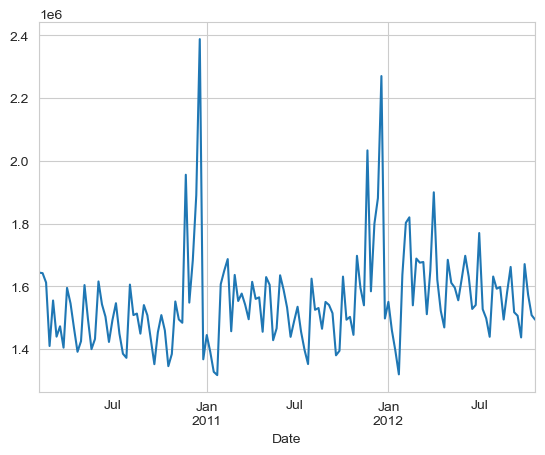

In [26]:
store.plot()

In [27]:
# AD Fuller Test
# p-value>0.05 --> not stationary --> Null Hyp
# p-value<0.05 --> stationary --> Alt Hyp
result = adfuller(store)
p_value = result[1]
print(p_value)
if p_value<0.05:
    print('Stationary')
else:
    print('Not stationary')

1.3877788330759535e-05
Stationary


In [28]:
# KPSS test( Kwiatkowski–Phillips–Schmidt–Shin test)
stats,p,lags,critical = kpss(store)
if p>0.05:
    print('Stationary')
else:
    print('Not stationary')
print(p)

Not stationary
0.047095888148842614


In [29]:
rolling_mean = store.rolling(window=52).mean()
rolling_mean

Date
2010-02-05             NaN
2010-02-12             NaN
2010-02-19             NaN
2010-02-26             NaN
2010-03-05             NaN
                  ...     
2012-09-28    1.613969e+06
2012-10-05    1.614734e+06
2012-10-12    1.616264e+06
2012-10-19    1.616370e+06
2012-10-26    1.617300e+06
Name: Weekly_Sales, Length: 143, dtype: float64

In [30]:
# removing trend from data
rolling_mean_detrended = store-rolling_mean
rolling_mean_detrended

Date
2010-02-05              NaN
2010-02-12              NaN
2010-02-19              NaN
2010-02-26              NaN
2010-03-05              NaN
                  ...      
2012-09-28   -176909.317308
2012-10-05     56052.084615
2012-10-12    -43190.823077
2012-10-19   -108300.747500
2012-10-26   -123640.751538
Name: Weekly_Sales, Length: 143, dtype: float64

Text(0.5, 1.0, 'Original data')

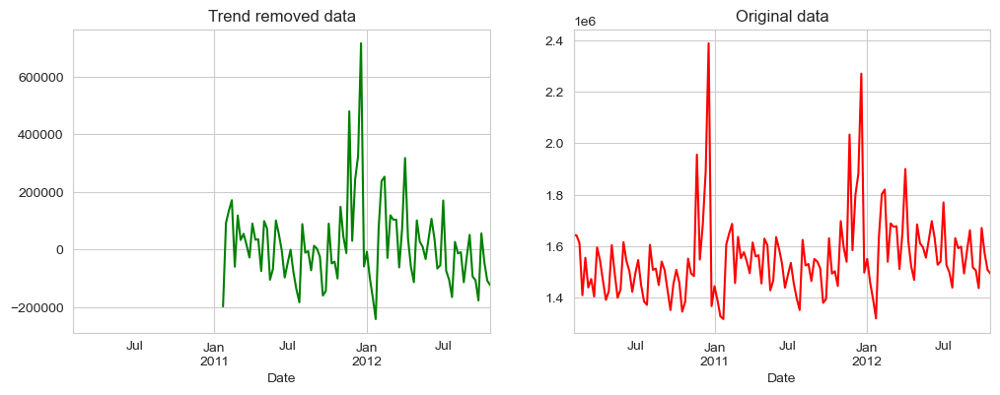

In [31]:
# comparision of normal and trend removed data
ax1 = plt.subplot(121)
rolling_mean_detrended.plot(figsize=(12,4),ax=ax1, color='green')
plt.title('Trend removed data')
ax2 = plt.subplot(122)
store.plot(figsize=(12,4),ax=ax2, color='red')
plt.title('Original data')

<Axes: xlabel='Date'>

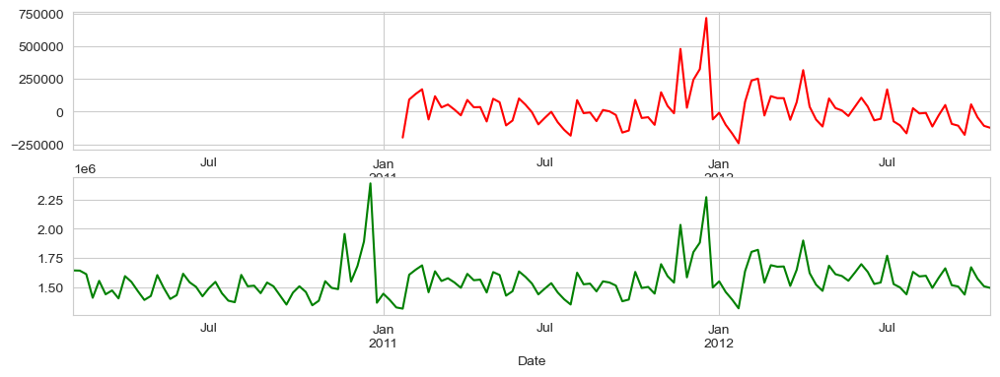

In [32]:
# comparision of normal and trend removed data
ax1 = plt.subplot(211)
rolling_mean_detrended.plot(figsize=(12,4),color='red',ax=ax1)
ax2 = plt.subplot(212)
store.plot(figsize=(12,4),color='green',ax=ax2)

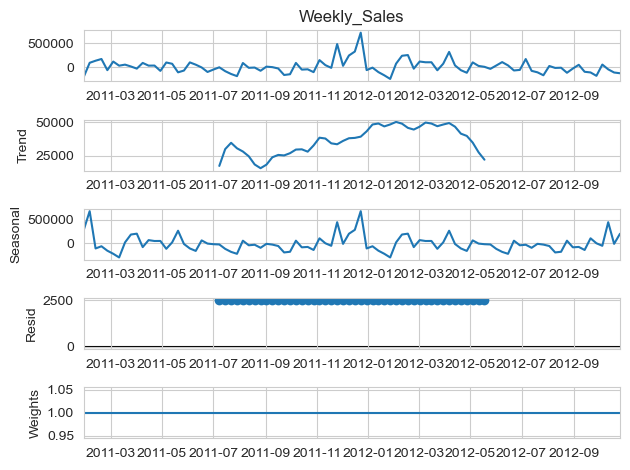

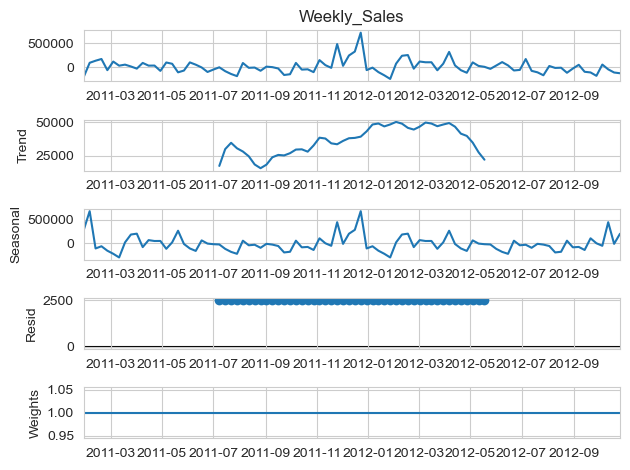

In [33]:
# removing seasionality
decompose_result = seasonal_decompose(rolling_mean_detrended.dropna(), period=46)
decompose_result.plot(weights=True)

In [34]:
# removing seasionality
rolling_mean_decomposed_diff = rolling_mean_detrended - rolling_mean_detrended.shift()
rolling_mean_decomposed_diff

Date
2010-02-05              NaN
2010-02-12              NaN
2010-02-19              NaN
2010-02-26              NaN
2010-03-05              NaN
                  ...      
2012-09-28    -69884.058269
2012-10-05    232961.401923
2012-10-12    -99242.907692
2012-10-19    -65109.924423
2012-10-26    -15340.004038
Name: Weekly_Sales, Length: 143, dtype: float64

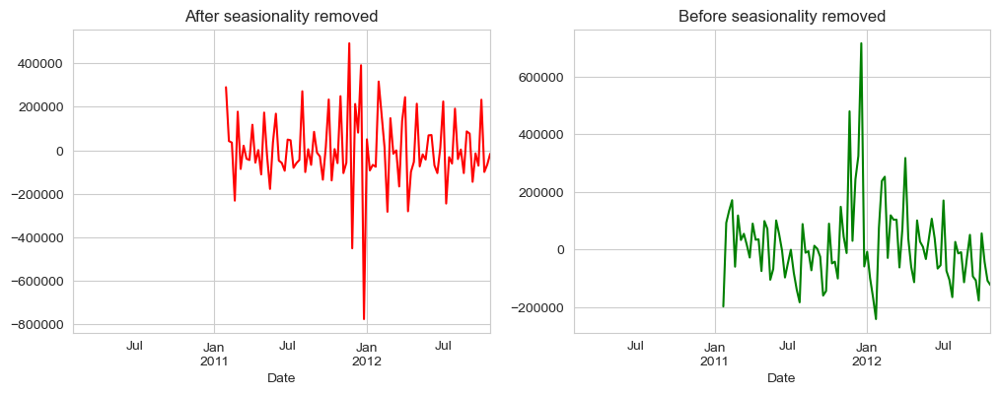

In [35]:
ax1=plt.subplot(121)
rolling_mean_decomposed_diff.plot(figsize=(12,4),color='red',ax=ax1)
plt.title('After seasionality removed')
ax2=plt.subplot(122)
rolling_mean_detrended.plot(figsize=(12,4),color='green',ax=ax2)
plt.title('Before seasionality removed')
plt.show()

In [36]:
rolling_mean_decomposed_diff.dropna(inplace=True)
rolling_mean_decomposed_diff

Date
2011-02-04    290442.987692
2011-02-11     42838.090577
2011-02-18     35787.953654
2011-02-25   -230947.744038
2011-03-04    177896.654423
                  ...      
2012-09-28    -69884.058269
2012-10-05    232961.401923
2012-10-12    -99242.907692
2012-10-19    -65109.924423
2012-10-26    -15340.004038
Name: Weekly_Sales, Length: 91, dtype: float64

In [37]:
final = adfuller(rolling_mean_decomposed_diff)
final[1]

3.257853293563638e-07

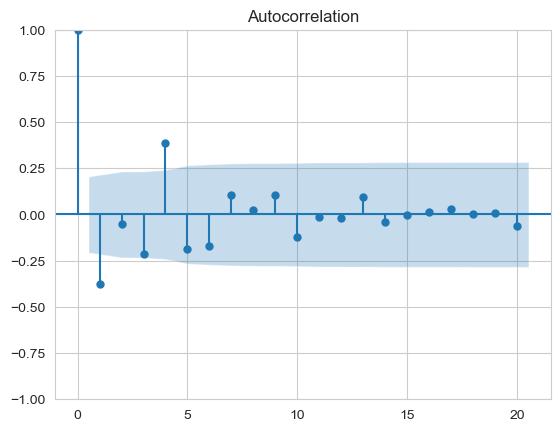

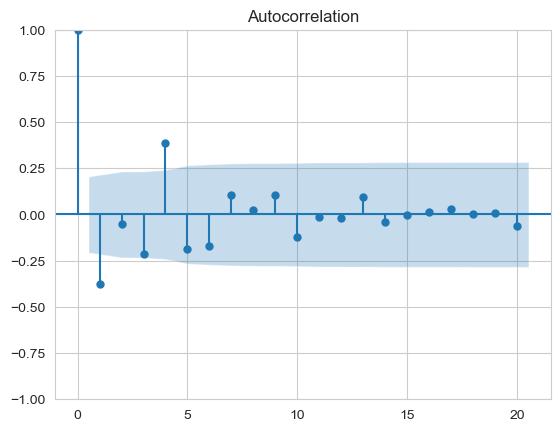

In [38]:
# auto correlation plot
plot_acf(rolling_mean_decomposed_diff)

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


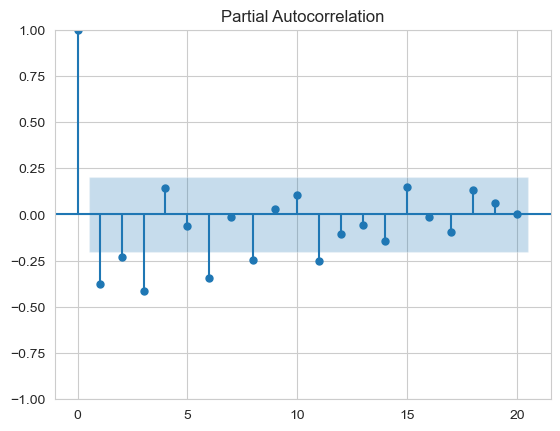

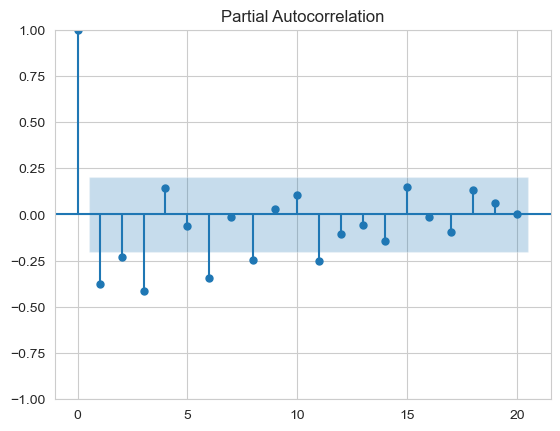

In [39]:
# partial auto correlation plot
plot_pacf(rolling_mean_decomposed_diff)

In [40]:
# finding the order for ARIMA model
order = auto_arima(rolling_mean_decomposed_diff,trace=True)
order.summary()

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=2428.230, Time=0.72 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=2454.958, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=2442.923, Time=0.13 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=2426.044, Time=0.10 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=2452.960, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0] intercept   : AIC=2426.893, Time=0.18 sec
 ARIMA(0,0,2)(0,0,0)[0] intercept   : AIC=2426.900, Time=0.18 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=2428.257, Time=0.25 sec
 ARIMA(0,0,1)(0,0,0)[0]             : AIC=2422.325, Time=0.05 sec
 ARIMA(1,0,1)(0,0,0)[0]             : AIC=2421.076, Time=0.11 sec
 ARIMA(1,0,0)(0,0,0)[0]             : AIC=2440.908, Time=0.03 sec
 ARIMA(2,0,1)(0,0,0)[0]             : AIC=inf, Time=0.29 sec
 ARIMA(1,0,2)(0,0,0)[0]             : AIC=2424.524, Time=0.45 sec
 ARIMA(0,0,2)(0,0,0)[0]             : AIC=2423.465, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[0]             : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   91
Model:               SARIMAX(1, 0, 1)   Log Likelihood               -1207.538
Date:                Wed, 18 Oct 2023   AIC                           2421.076
Time:                        11:09:48   BIC                           2428.608
Sample:                    02-04-2011   HQIC                          2424.115
                         - 10-26-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2370      0.116      2.050      0.040       0.010       0.464
ma.L1         -0.9361      0.054    -17.315      0.000      -1.042      -0.830
sigma2      2.002e+10   7.21e-13   2.78e+22      0.000       2e+10       2e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                83.49
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):               1.21   Skew:                             1.39
Prob(H) (two-sided):                  0.61   Kurtosis:                         6.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number    inf. Standard errors may be unstable.
"""

In [41]:
train = rolling_mean_decomposed_diff.iloc[:73]
test = rolling_mean_decomposed_diff.iloc[73:]
# ARIMA ---> AR + MA +I ---> ARIMA--> AR=1 , I=0 , MA=1
model = ARIMA(train, order=(1,0,1))
model_fit = model.fit() # training 
model_fit.summary()

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:           Weekly_Sales   No. Observations:                   73
Model:                 ARIMA(1, 0, 1)   Log Likelihood                -972.872
Date:                Wed, 18 Oct 2023   AIC                           1953.744
Time:                        11:09:48   BIC                           1962.906
Sample:                    02-04-2011   HQIC                          1957.395
                         - 06-22-2012                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1802.9196   1363.342      1.322      0.186    -869.181    4475.021
ar.L1          0.2757      0.095      2.912      0.004       0.090       0.461
ma.L1         -0.9892      0.131     -7.572      0.000      -1.245      -0.733
sigma2      2.317e+10   4.19e-05   5.53e+14      0.000    2.32e+10    2.32e+10
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                55.00
Prob(Q):                              0.93   Prob(JB):                         0.00
Heteroskedasticity (H):               1.84   Skew:                             1.34
Prob(H) (two-sided):                  0.14   Kurtosis:                         6.31
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.49e+30. Standard errors may be unstable.
"""

In [42]:
Predict = model_fit.predict(start= len(train), 
                                    end=len(train)+len(test)- 1, 
                                    dynamic=True)
Predict

2012-06-29    117101.293134
2012-07-06     33592.104399
2012-07-13     10567.590238
2012-07-20      4219.447472
2012-07-27      2469.186150
2012-08-03      1986.617499
2012-08-10      1853.567365
2012-08-17      1816.883801
2012-08-24      1806.769690
2012-08-31      1803.981104
2012-09-07      1803.212257
2012-09-14      1803.000276
2012-09-21      1802.941830
2012-09-28      1802.925716
2012-10-05      1802.921273
2012-10-12      1802.920048
2012-10-19      1802.919711
2012-10-26      1802.919617
Freq: W-FRI, Name: predicted_mean, dtype: float64

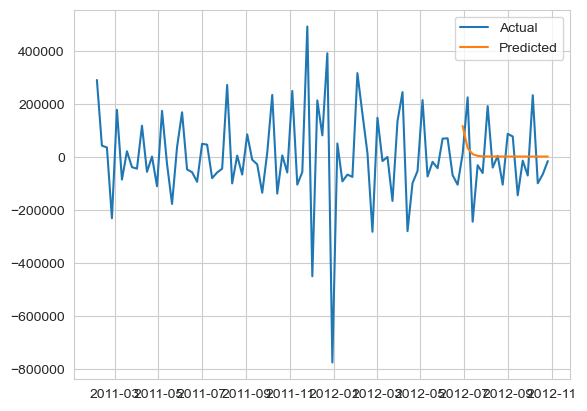

In [43]:
plt.plot(rolling_mean_decomposed_diff, label='Actual')
plt.plot(Predict, label='Predicted')
plt.legend()

In [44]:
mean_absolute_error(test, Predict)

100046.5786939488

In [45]:
mean_absolute_percentage_error(test, Predict)

1.4490914542232423

In [46]:
r2_score(test, Predict)

-0.0106064982951517

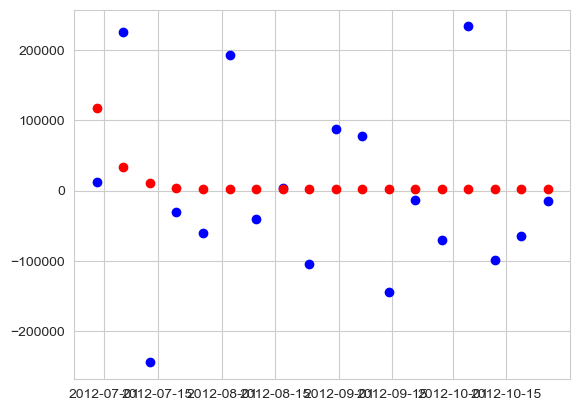

In [47]:
plt.plot(test, 'bo')
plt.plot(Predict, 'ro')

ARIMA model with order (1,0,1) not performing well. Lets try with the SARIMAX model with the same order

In [48]:
model=SARIMAX(train,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
model=model.fit()

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization

In [49]:
predict = model.predict(start= len(train) ,end=len(train)+len(test)- 1, dynamic=True)
predict

2012-06-29     48557.759116
2012-07-06     45012.306438
2012-07-13    -76874.032730
2012-07-20    -56226.353166
2012-07-27    -42647.629143
2012-08-03    262131.678190
2012-08-10    -95914.528273
2012-08-17      5157.141249
2012-08-24    -63919.820542
2012-08-31     82341.649540
2012-09-07     -9964.204524
2012-09-14    -26775.261023
2012-09-21   -129902.943956
2012-09-28     15145.072617
2012-10-05    225698.976405
2012-10-12   -133142.723367
2012-10-19      5817.704243
2012-10-26    -56378.338887
Freq: W-FRI, Name: predicted_mean, dtype: float64

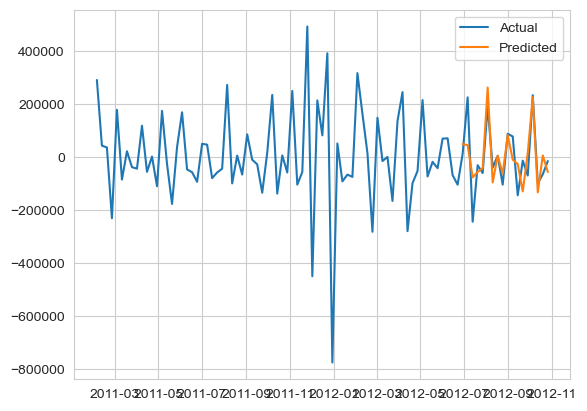

In [50]:
plt.plot(rolling_mean_decomposed_diff, label='Actual')
plt.plot(predict, label='Predicted')
plt.legend()

From the above graph we can see that the SARIMAX model with seasional order (1,0,1,52) predicted the values perfectly.

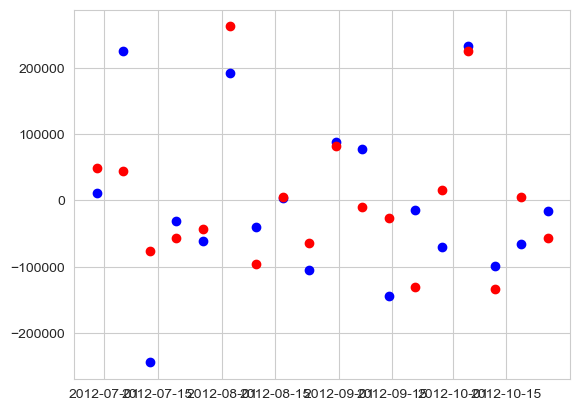

In [51]:
plt.plot(test, 'bo')
plt.plot(predict, 'ro')

In [52]:
mean_absolute_error(test, predict)

64395.17972417454

In [53]:
mean_absolute_percentage_error(test, predict)

1.3329322700779485

In [54]:
r2_score(test, predict)

0.5500048606545698

From the above graph we can see that the predicted data is mostly nearby to the actual data.

In [55]:
# lets forecast the sales for next 52 weeks
store_1 = Stores[1]['Weekly_Sales']
model=SARIMAX(store_1,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
model = model.fit()
forecast = model.predict(start= len(store_1) ,end=len(store_1)+52, dynamic=True)
forecast

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


2012-11-02    1.702538e+06
2012-11-09    1.609169e+06
2012-11-16    1.557824e+06
2012-11-23    1.994240e+06
2012-11-30    1.590326e+06
2012-12-07    1.774127e+06
2012-12-14    1.850959e+06
2012-12-21    2.202046e+06
2012-12-28    1.490771e+06
2013-01-04    1.535886e+06
2013-01-11    1.453232e+06
2013-01-18    1.391336e+06
2013-01-25    1.324636e+06
2013-02-01    1.611756e+06
2013-02-08    1.749430e+06
2013-02-15    1.762810e+06
2013-02-22    1.510662e+06
2013-03-01    1.643552e+06
2013-03-08    1.623935e+06
2013-03-15    1.624280e+06
2013-03-22    1.480222e+06
2013-03-29    1.590770e+06
2013-04-05    1.803485e+06
2013-04-12    1.564932e+06
2013-04-19    1.479413e+06
2013-04-26    1.426278e+06
2013-05-03    1.615052e+06
2013-05-10    1.549386e+06
2013-05-17    1.522843e+06
2013-05-24    1.489322e+06
2013-05-31    1.555961e+06
2013-06-07    1.611092e+06
2013-06-14    1.549686e+06
2013-06-21    1.455762e+06
2013-06-28    1.467595e+06
2013-07-05    1.659798e+06
2013-07-12    1.450130e+06
2

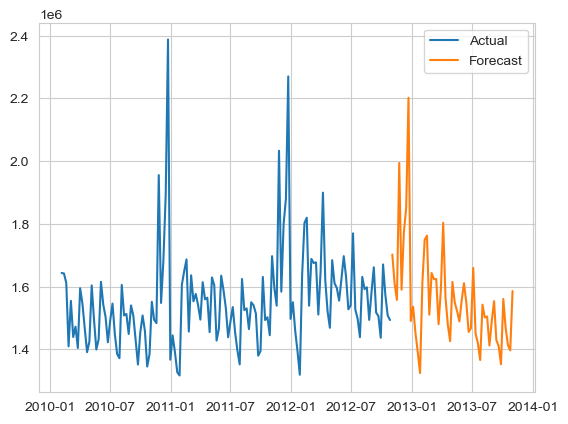

In [56]:
plt.plot(store_1, label='Actual')
plt.plot(forecast, label='Forecast')
plt.legend()

From the above graph we can see that this SARIMAX model with seasional order of (1,0,1,52) forecated the weekly sales for next 52 weeks perfectly.

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\

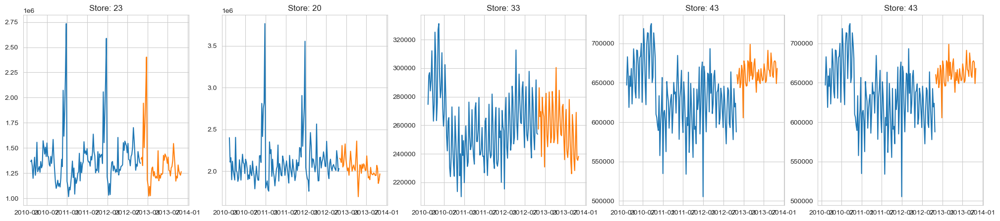

In [57]:
# Lets check this model for 5 various store
plt.subplots(1,5, figsize=(25,5))
j = 1
for i in np.random.randint(1,45,5):
    store = Stores[i]['Weekly_Sales']
    model=SARIMAX(store,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
    model = model.fit()
    forecast = model.predict(start= len(store) ,end=len(store)+52, dynamic=True)
    plt.subplot(1,5,j)
    plt.plot(store, label='Actual')
    plt.plot(forecast, label='Forecast')
    plt.title(f'Store: {i}')
    j += 1

we can see that the SARIMAX model forecast prefdectly for all stores.

#### Forecast next 12 weeks sales for each store

In [58]:
# forecast 12 weeks for each store
predictions = {}
for i in range(1,len(df.Store.unique())+1):
    store = Stores[i]['Weekly_Sales']
    model=SARIMAX(store,order=(1,0,1),seasonal_order=(1,0,1,52),enforce_stationarity=False)
    model=model.fit()
    predict = model.predict(start= len(store) ,end=len(store)+12, dynamic=True)
    predictions[i] = predict

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\

C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency W-FRI will be used.
  self._init_dates(dates, freq)
C:\Users\Nandhakumar\anaconda3\Anaconda2023\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


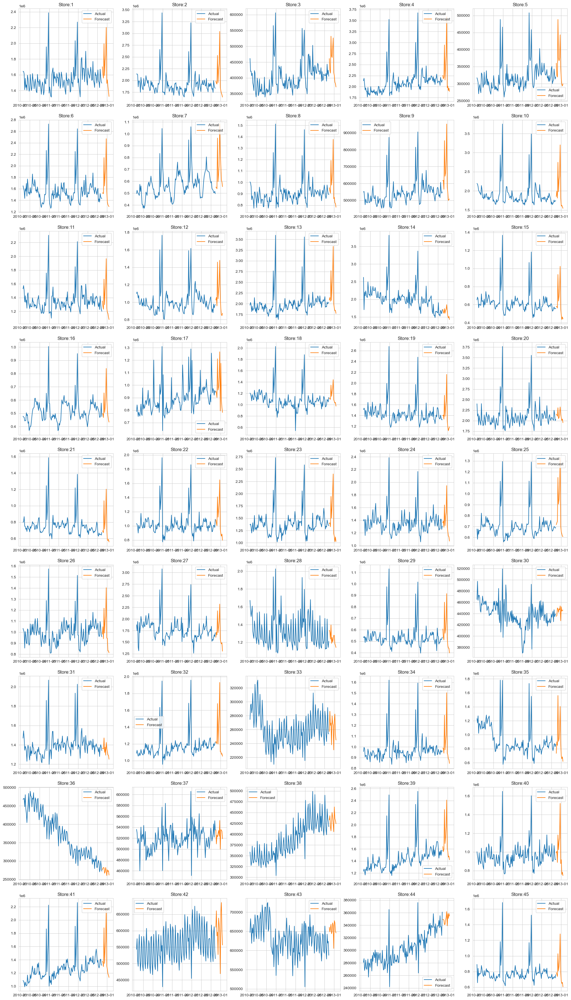

In [59]:
# plot forecasting of each store
plt.subplots(9,5, figsize=(25,45))
for i in range (1,46):
    store=Stores[i]['Weekly_Sales']
    predict = predictions[i]
    plt.subplot(9,5,i)
    plt.plot(store, label='Actual')
    plt.plot(predict, label='Forecast')
    plt.legend()
    plt.title(f'Store:{i}')

From the above graph we can confirm that the SARIMAX model forecated perfectly for 37 stores out of 45 stores.

In [85]:
model.predict(142, dynamic=True)

2012-10-26    738138.166184
Freq: W-FRI, dtype: float64

In [79]:
Stores[1]

,Store,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment,year,month,week
Date,,,,,,,,,,
2010-02-05,1,1643690.90,0,42.31,2.572,211.096358,8.106,2010,2,5
2010-02-12,1,1641957.44,1,38.51,2.548,211.242170,8.106,2010,2,6
2010-02-19,1,1611968.17,0,39.93,2.514,211.289143,8.106,2010,2,7
2010-02-26,1,1409727.59,0,46.63,2.561,211.319643,8.106,2010,2,8
2010-03-05,1,1554806.68,0,46.50,2.625,211.350143,8.106,2010,3,9
...,...,...,...,...,...,...,...,...,...,...
2012-09-28,1,1437059.26,0,76.08,3.666,222.981658,6.908,2012,9,39
2012-10-05,1,1670785.97,0,68.55,3.617,223.181477,6.573,2012,10,40
2012-10-12,1,1573072.81,0,62.99,3.601,223.381296,6.573,2012,10,41


In [86]:
predictions[1]

2012-11-02    1.702538e+06
2012-11-09    1.609169e+06
2012-11-16    1.557824e+06
2012-11-23    1.994240e+06
2012-11-30    1.590326e+06
2012-12-07    1.774127e+06
2012-12-14    1.850959e+06
2012-12-21    2.202046e+06
2012-12-28    1.490771e+06
2013-01-04    1.535886e+06
2013-01-11    1.453232e+06
2013-01-18    1.391336e+06
2013-01-25    1.324636e+06
Freq: W-FRI, Name: predicted_mean, dtype: float64